# Проект "Поиск по изображениям"

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

## Предварительный анализ

Произведем загрузку данных и осуществим предварительный анализ имеющейся информации

In [1]:
import os
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import optuna
from PIL import Image
from tqdm import tqdm
import spacy

import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet import ResNet50
from keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Dropout
from keras.models import Sequential
from keras.optimizers import Adam

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import GroupShuffleSplit
from sklearn.metrics import mean_squared_error
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingRegressor

import nltk
from nltk.corpus import stopwords as nltk_stopwords
from wordcloud import WordCloud

nltk.download('stopwords')
plt.style.use('seaborn-v0_8-darkgrid')
PATH = 'to_upload'
SEED = 131264

tqdm.pandas()
pd.options.mode.chained_assignment = None
np.random.seed(SEED)
tf.random.set_seed(SEED)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tolya\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


В файле **train_dataset.csv** находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания.

Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат:
<имя файла изображения>#<порядковый номер описания>.

В папке train_images содержатся изображения для тренировки модели.


In [2]:
df_train = pd.read_csv(PATH +'/train_dataset.csv')
df_train.sample(5, random_state=SEED)

,image,query_id,query_text
1025,3542484764_77d8920ec9.jpg,3514019869_7de4ece2a5.jpg#2,A dog jumps over an obstacle .
4945,3433982387_3fa993cf5a.jpg,3545586120_283d728a97.jpg#2,Two boxers with white gloves are fighting .
2018,1402640441_81978e32a9.jpg,1764955991_5e53a28c87.jpg#2,A dog with a ball in his mouth running down a ...
1458,1572532018_64c030c974.jpg,2707873672_15e6b5d54b.jpg#2,Two redheaded boys in brown shirts stand on a ...
2228,1432179046_8e3d75cf81.jpg,1765164972_92dac06fa9.jpg#2,A profile of a young person with a punk hairst...


В файле **CrowdAnnotations.tsv** — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.


In [3]:
df_crowd = pd.read_csv(PATH + '/CrowdAnnotations.tsv', sep='\t', header=None)
df_crowd.columns = ['image', 'query_id', 'user_rating', 'сount_true', 'count_false']
df_crowd.head()

,image,query_id,user_rating,сount_true,count_false
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


В файле **ExpertAnnotations.tsv** содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где:

1 — изображение и запрос совершенно не соответствуют друг другу,

2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует,

3 — запрос и текст соответствуют с точностью до некоторых деталей,

4 — запрос и текст соответствуют полностью.

In [4]:
df_expert = pd.read_csv(PATH + '/ExpertAnnotations.tsv', sep='\t', header=None)
df_expert.columns = ['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']
df_expert.head()

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


В файле **test_queries.csv** находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

In [5]:
df_test = pd.read_csv(PATH + '/test_queries.csv', sep='|', index_col=[0])
df_test.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

Доля исполнителей, подтвердивших, что текст соответствует картинке.
Количество исполнителей, подтвердивших, что текст соответствует картинке.
Количество исполнителей, подтвердивших, что текст не соответствует картинке.
После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.

In [6]:
# посмотрим какое количество фотографий содержится в тренировочной и в тестовой выборках
print(f'количество фотографий в тренировочной выборке :{df_train.image.nunique()}')
print(f'количество фотографий в тестовой выборке :{df_test.image.nunique()}')

количество фотографий в тренировочной выборке :1000
количество фотографий в тестовой выборке :100


In [7]:
# посмотрим количество оценок экспертов и краудсорсинга
print('количество проверенных описаний экспертами :{0}'.format(df_expert.loc[:,['image', 'query_id']].drop_duplicates().shape[0]))
print('количество проверенных описаний краудсорсинга :{0}'.format(df_crowd.loc[:,['image', 'query_id']].drop_duplicates().shape[0]))

количество проверенных описаний экспертами :5822
количество проверенных описаний краудсорсинга :47830


In [8]:
# посмотрим на распределение данных у экспертов
df_expert.describe()

,expert_1,expert_2,expert_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Медиана по эксперту 1 и эксперту 2 равна 1, что означает, что для данных экспертов 50% изображений и запросов не соответствуют друг другу. У эксперта 3 медиана равна 2 (запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует). Можно сделать вывод о том, что качеством разметки эксперты не довольны.

In [9]:
df_crowd.describe() # посмотрим на распределение данных у краудсорсинга

,user_rating,сount_true,count_false
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


Низкое качество разметки данных отмечается и представителями краудсорсинга.

Рассмотрим оценки экспертов: если за оценку проголосовали 2 или 3 эксперта, то вернем ее. Если эксперты не сошлись в оценке, то вернем 0.

In [10]:
def score(ex1: int, ex2: int, ex3: int) -> int:
    '''возвращает оценку за которую проголосовало большинство экспертов'''
    if ex1 == ex2 or ex1 == ex3:
        return ex1
    elif ex2 == ex3:
        return ex2
    else:
        return 0

In [11]:
df_expert['expert_rating'] = df_expert.apply(lambda x: score(x['expert_1'], x['expert_2'], x['expert_3']), axis = 1) # применяем функцию
df_expert['expert_rating'].value_counts(normalize=True) # отсматриваем на распределение

1    0.571453
2    0.268980
3    0.084507
4    0.053418
0    0.021642
Name: expert_rating, dtype: float64

В 2.1% случаев эксперты не пришли к единому решению. Отбросим оценки, в которых эксперты не сошлись.

In [12]:
df_expert = df_expert.loc[df_expert['expert_rating'] != 0, ['image', 'query_id', 'expert_rating']]

И применим MinMaxScaler для того, чтобы оценка была от 0 до 1. Несмотря на то, что Scaler применяется ко всей выборке, а не только к обучающей, утечки данных произойти не должно, поскольку min и max остаются неизменными.

In [13]:
scaler = MinMaxScaler()
df_expert['expert_rating'] = scaler.fit_transform(df_expert.loc[:,['expert_rating']])
df_expert.reset_index(drop=True, inplace=True)

In [14]:
df_expert.shape[0]

5696

После обработки оценки экспертов у нас осталось 5696 запросов.

Перейдем к оценке Crowd. Для ее обработки создадим df_score, который будет содержать оценки экспертов и краудсорсинга.

In [15]:
df_score = pd.merge(df_expert, df_crowd.loc[:,['image', 'query_id', 'user_rating']], how ='outer', on = ['image', 'query_id'])

In [16]:
def finaly_score(expert:int, user:int) -> int:
    '''Требуется для агрегирования оценки '''
    if pd.notna(expert):
        return expert
    elif pd.notna(user):
        return user
    else:
        return None

In [17]:
df_score['finaly_score'] = df_score.apply(lambda x: finaly_score(x['expert_rating'], x['user_rating']), axis = 1) # применяем функцию
df_score = df_score.loc[df_score['finaly_score'].notna(), ['image', 'query_id', 'finaly_score']]   # удаляем строки где есть пропуски в финальной оценке
df_score.reset_index(drop=True, inplace=True) # обновляем индексы
df_score.head()

,image,query_id,finaly_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.000000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.333333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.000000


In [18]:
df_score.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51268 entries, 0 to 51267
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         51268 non-null  object 
 1   query_id      51268 non-null  object 
 2   finaly_score  51268 non-null  float64
dtypes: float64(1), object(2)
memory usage: 1.2+ MB


После объединения на выходе получаем 51268 строк без пропусков в данных.

Добавляем полученные оценки в тренировочную выборку:

In [19]:
df_train = pd.merge(df_train, df_score, how ='left', on = ['image', 'query_id'])

In [20]:
df_train.head() #проверим как выглядит тренировочный датасет

,image,query_id,query_text,finaly_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


In [21]:
df_train.isna().sum()  # проверим тренировочную выборку на пропуски

image            0
query_id         0
query_text       0
finaly_score    55
dtype: int64

В выборке содержится 55 пропусков - тех случаев, в которых эксперты не сошлись во мнении.

In [22]:
df_train = df_train[df_train['finaly_score'].notna()]

In [23]:
def plot(df:pd.core.frame.DataFrame, text: str):
    '''Рисует изображения с подписями '''
    df = df.sample(9, random_state=SEED)
    fig = plt.figure(figsize=(25, 10))
    fig.suptitle(text, fontsize=15, fontweight='bold')
    for i in range(9):
        plt.subplot(3, 3, i+1)
        image = Image.open(PATH + '/train_images/' + df.iloc[i]['image'])
        plt.imshow(image)
        plt.title(df.iloc[i]['query_text'], fontsize= 10 , loc='left')
        plt.axis('off')

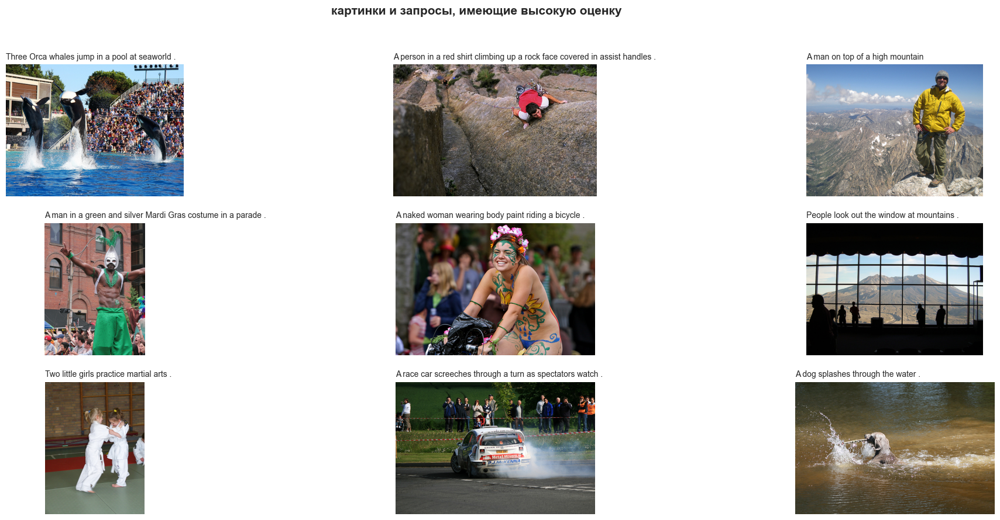

In [24]:
plot(df_train.loc[df_train['finaly_score'] >= 0.8], 'картинки и запросы, имеющие высокую оценку')

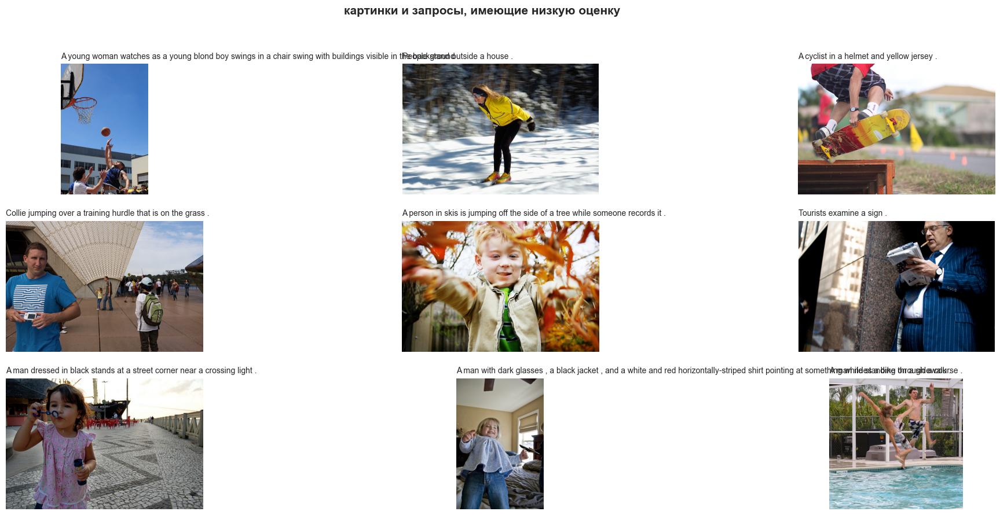

In [25]:
plot(df_train.loc[df_train['finaly_score'] == 0], 'картинки и запросы, имеющие низкую оценку')

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

This image is unavailable in your country in compliance with local laws

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Проведем лемматизацию текста

In [27]:
nlp = spacy.load('en_core_web_sm', disable = ['parser', 'ner'])

def text_token(text:str) -> str:
    text = re.sub(r'[^a-zA-Z]', ' ', text)
    text = ' '.join([token.lemma_ for token in nlp(text.lower())])
    return text

In [28]:
df_train['lem_text'] = df_train['query_text'].progress_apply(text_token)

100%|██████████| 5767/5767 [00:21<00:00, 266.27it/s]


Смотрим результаты:

In [29]:
df_train.loc[:,['query_text', 'lem_text']].sample(10, random_state=SEED)

,query_text,lem_text
3751,A woman in blue has a yellow ball in her mitt .,a woman in blue have a yellow ball in her mitt
4861,People trackside at a subway station by a train .,people trackside at a subway station by a train
1837,A rock climber climbs in between two very larg...,a rock climber climb in between two very large...
2029,A dog with a ball in his mouth running down a ...,a dog with a ball in his mouth run down a road...
1255,A snowboarder in the air over a snowy mountain .,a snowboarder in the air over a snowy mountain
174,A man riding a motorcycle is performing a tric...,a man ride a motorcycle be perform a trick at ...
3097,A mountain biker is jumping his bike over a ro...,a mountain biker be jump his bike over a rock ...
1764,A person is standing on jagged rocks above the...,a person be stand on jagged rock above the wat...
5624,A surfer is flipping up in the air on a surfbo...,a surfer be flip up in the air on a surfboard
3950,A girl goes down a blue and yellow slide at a ...,a girl go down a blue and yellow slide at a pa...


Произведем визуализацию наиболее часто встречающихся слов в запросах, имеющих самую высокую оценку и самую низкую оценку

In [30]:
def world_cloud(df):
    '''Функция служит для визуализации частоты слов'''
    text_cloud = ' '.join(df['lem_text'])
    cloud = WordCloud(stopwords=nltk_stopwords.words('english'), max_words=80, collocations=False).generate(text_cloud)
    plt.figure(figsize=(12,8))
    plt.imshow(cloud)
    plt.axis('off')
    plt.show()

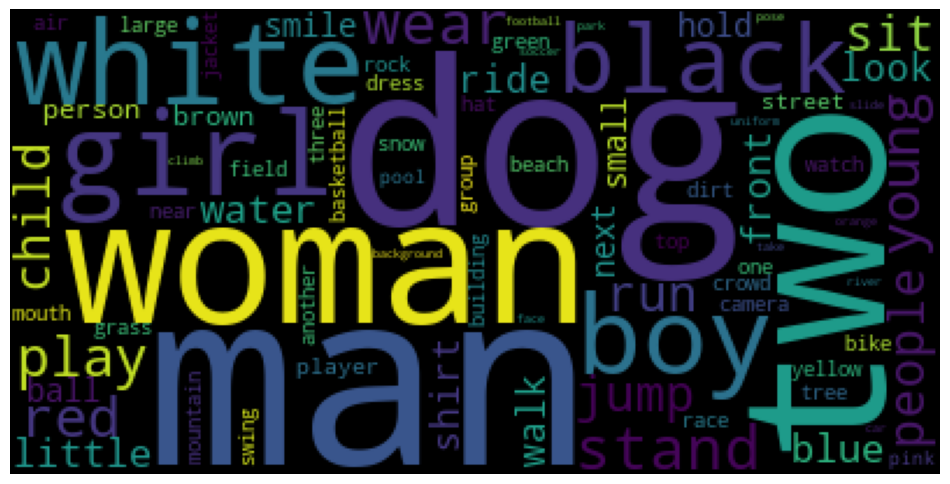

In [31]:
world_cloud(df_train[df_train['finaly_score'] == 0]) 
#отобразим самые частые слова с низким рейтингом

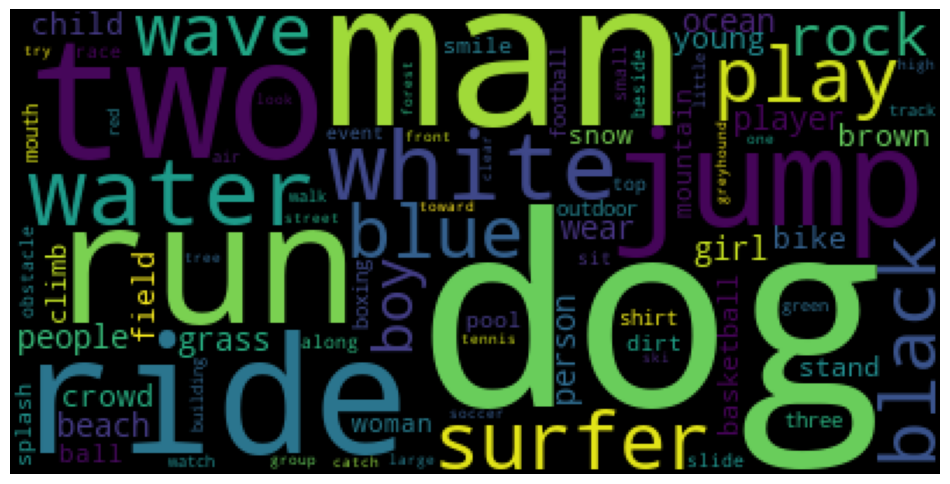

In [32]:
world_cloud(df_train[df_train['finaly_score'] == 1])  
#отобразим самые частые слова с высоким рейтингом

Результаты интересны - выходит, что люди подписывают корректно очевидные вещи - "синий", "носит", "собака", "два", "вода", "человек" и т.д. При этом, как показывает первый рисунок, даже в базовых вещах ("девушка", "белый", "собака", женщина", "человек") могут быть совершены ошибки.

Для удаления фотографий с детьми будем следовать следующему способу. В случае, если рейтинг описания выше 0.5 и в нем содержатся слова "child", "boy", "girl", "kid", "baby" и "teenage", то такая фотография должна быть удалена из выборки.

In [33]:
STOP_WORDS = ['child', 'boy', 'girl', 'kid', 'baby', 'teenage'] #создаём глобальную переменную списка стоп-слов

def stop_image(df:pd.core.frame.DataFrame) -> list:
    stop = []
    for index, row in df.iterrows():  #проходимся по датафрейму
        for word in STOP_WORDS: #проходим по списку слов
            if word in row['lem_text'] and row['finaly_score'] >= 0.5:
                stop.append(row['image'])
                break
    return list(set(stop))

In [34]:
stop_image = stop_image(df_train)

In [35]:
#посмотрим, сколько изображений попадают под бан
len(stop_image)

107

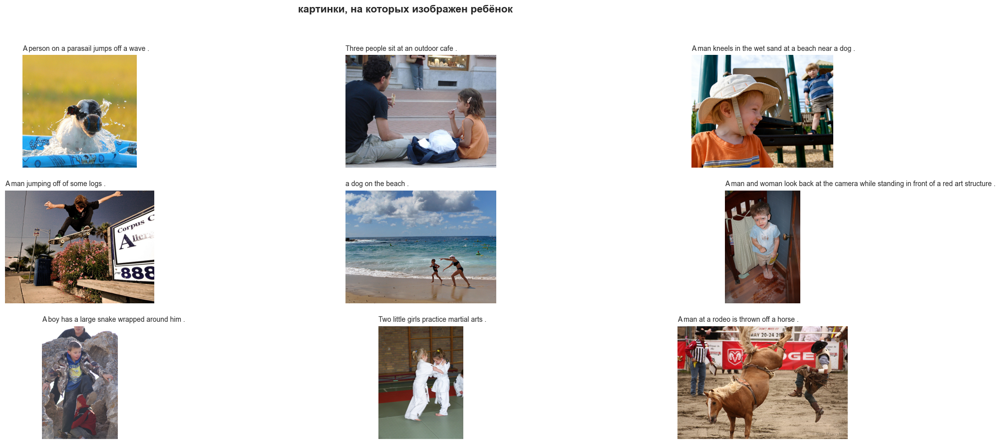

In [36]:
plot(df_train[df_train['image'].isin(stop_image)], 'картинки, на которых изображен ребёнок')

Фильтрация данных так себе. Вместе с тем, лучше удалить несколько больше данных, чем случайно нарушить законодательство страны.

In [37]:
df_train = df_train[~(df_train['image'].isin(stop_image))]
df_train.reset_index(drop=True, inplace=True)

## Векторизация изображений

Перейдём к векторизации изображений, которую произведем с использованием сверточных сетей, позволяющих выделить главные компоненты изображений.

In [38]:
datagen = ImageDataGenerator(rescale=1./255)

In [39]:
train_datagen_flow = datagen.flow_from_dataframe(
    dataframe=df_train,
    directory=PATH + '/train_images',
    x_col='image',
    y_col='finaly_score',
    target_size = (224, 224),
    batch_size = 16,
    class_mode = 'raw',
    shuffle = False,
    seed = SEED)

Found 5155 validated image filenames.


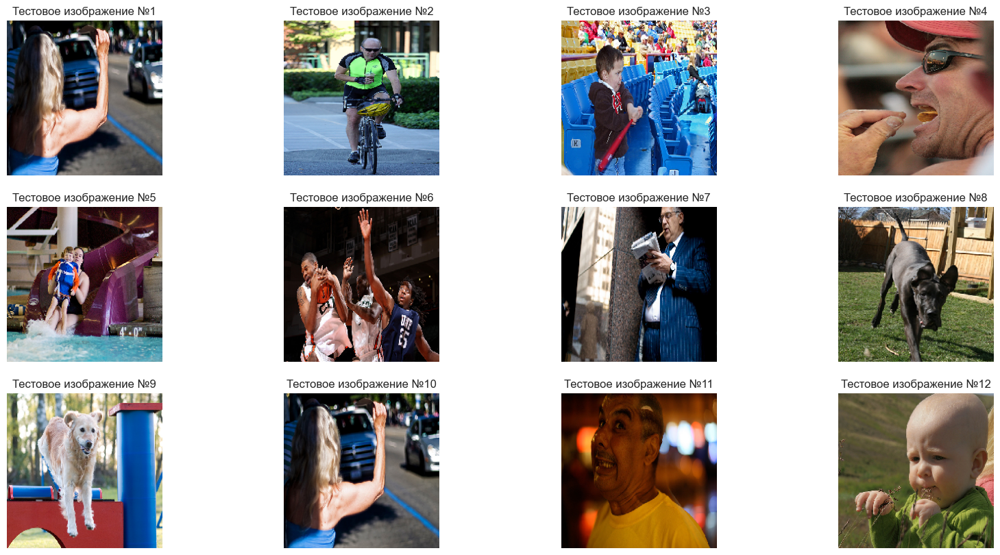

In [40]:
features, target = next(train_datagen_flow)
fig = plt.figure(figsize = (20, 10))
for i in range(12):
    plt.subplot(3, 4, i+1)
    plt.imshow(features[i])
    plt.title(f'Тестовое изображение №{i+1}')
    plt.axis('off')

Дети на изображениях все равно присутствуют. При этом, если на этапе фильтрации снизить важность оценки (удалять изображение даже в случае, если текстовое описание не совсем соответствует изображению), то в таком случае будут выкинуты много корректных изображений. Пожалуй, лучший способ - отфильтровать фотографии вручную.

In [41]:
model = Sequential()
model.add(ResNet50(include_top=False, weights='imagenet', input_shape=(224, 224, 3)))
model.add(GlobalAveragePooling2D())

optimizer = Adam(learning_rate=1e-3)
model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=['mae'])

In [42]:
image_vec = model.predict(train_datagen_flow)

323/323 [==============================] - 634s 2s/step


In [43]:
image_vec.shape #посмотрим на размер

(5155, 2048)

## Векторизация текстов

Лучшим решением, естественно, будет использование трансформеров. Однако, принимая во внимание размер датасета и отсутствие больших вычислительных мощностей, принято решение применить tf-idf.

In [44]:
tf_idf = TfidfVectorizer(stop_words=list(nltk_stopwords.words('english')), ngram_range=(1, 2))
tf_vec = tf_idf.fit_transform(df_train['lem_text'])

In [45]:
tf_vec.shape

(5155, 4903)

In [46]:
print(type(image_vec))
print(type(tf_vec))

<class 'numpy.ndarray'>
<class 'scipy.sparse._csr.csr_matrix'>


## Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [47]:
tf_vec = tf_vec.toarray()

In [48]:
features = np.concatenate((tf_vec, image_vec), axis=1)
target = df_train['finaly_score']

In [49]:
print(features.shape)
print(target.shape)

(5155, 6951)
(5155,)


Признаки получились 5155 строк на 6954 колонки    
из 6954 колонок 2048 это колонки векторного изображения фотографий и 4906 колонки текстовых запросов

## Обучение модели предсказания соответствия

Попробуем применить градиентный бустинг и небольшую нейронную сеть. Простоые модели (линейные, случайный лес) на таком наборе данных отработают хуже.

В качестве метрики предлагаю использовать `rmse` (данная метрика уменьшает небольшие отклонения и наоборот)

In [50]:
features = pd.DataFrame(features)
target = pd.DataFrame(target)

In [51]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=SEED)
train_indices, val_indices = next(gss.split(X=features, y=target, groups=df_train['image']))

features_train, features_val = features.loc[train_indices], features.loc[val_indices]
target_train, target_val = target.loc[train_indices], target.loc[val_indices]

In [53]:
def objective_lgbm(trial):
    max_depth = trial.suggest_int('max_depth', 2, 5)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 0.1, log=True)
    n_estimators = trial.suggest_int('n_estimators', 100, 250)

    model = GradientBoostingRegressor(max_depth=max_depth, learning_rate=learning_rate, n_estimators=n_estimators)
    model.fit(features_train, np.ravel(target_train))
    score = mean_squared_error(np.ravel(target_val), model.predict(features_val))

    return score

In [54]:
study = optuna.create_study(direction='minimize')
study.optimize(objective_lgbm, n_trials=8)

[I 2023-10-24 15:15:44,032] A new study created in memory with name: no-name-0da9b1d7-d9d1-49f1-af7e-8db3f3f9e448
[I 2023-10-24 15:25:50,971] Trial 0 finished with value: 0.06625916254692799 and parameters: {'max_depth': 5, 'learning_rate': 0.03244938010284227, 'n_estimators': 194}. Best is trial 0 with value: 0.06625916254692799.
[I 2023-10-24 15:36:31,374] Trial 1 finished with value: 0.06919821647376923 and parameters: {'max_depth': 5, 'learning_rate': 0.0022703316465058345, 'n_estimators': 218}. Best is trial 0 with value: 0.06625916254692799.
[I 2023-10-24 15:46:42,915] Trial 2 finished with value: 0.07099491019212785 and parameters: {'max_depth': 5, 'learning_rate': 0.000882141300384542, 'n_estimators': 197}. Best is trial 0 with value: 0.06625916254692799.
[I 2023-10-24 15:54:23,135] Trial 3 finished with value: 0.06798433467343241 and parameters: {'max_depth': 4, 'learning_rate': 0.004440369966432769, 'n_estimators': 179}. Best is trial 0 with value: 0.06625916254692799.
[I 202

In [55]:
study.best_value

0.06602613783044993

In [56]:
study.best_params

{'max_depth': 3, 'learning_rate': 0.01672927098774598, 'n_estimators': 239}

Попробуем применить небольшую нейронную сеть и посмотреть на результат

In [58]:
network = Sequential()
network.add(Dense(1024, input_shape=(features_train.shape[1],), activation='relu'))
network.add(BatchNormalization())
network.add(Dropout(0.1))
network.add(Dense(256, activation='relu'))
network.add(BatchNormalization())
network.add(Dropout(0.1))
network.add(Dense(256, activation='relu'))
network.add(BatchNormalization())
network.add(Dropout(0.1))
network.add(Dense(64, activation='relu'))
network.add(BatchNormalization())
network.add(Dense(32, activation='relu'))
network.add(BatchNormalization())
network.add(Dense(16, activation='relu'))
network.add(BatchNormalization())
network.add(Dense(8, activation='relu'))
network.add(BatchNormalization())
network.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

network.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

network.build()

network.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 1024)              7118848   
                                                                 
 batch_normalization_7 (Bat  (None, 1024)              4096      
 chNormalization)                                                
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_9 (Dense)             (None, 256)               262400    
                                                                 
 batch_normalization_8 (Bat  (None, 256)               1024      
 chNormalization)                                                
                                                                 
 dropout_4 (Dropout)         (None, 256)              

In [59]:
network.fit(features_train, target_train, validation_data=(features_val, target_val), batch_size=64, epochs=15, verbose=2, shuffle=True)

Epoch 1/15
56/56 - 15s - loss: 0.3018 - root_mean_squared_error: 0.5493 - val_loss: 0.0759 - val_root_mean_squared_error: 0.2754 - 15s/epoch - 267ms/step
Epoch 2/15
56/56 - 8s - loss: 0.2716 - root_mean_squared_error: 0.5211 - val_loss: 0.0832 - val_root_mean_squared_error: 0.2885 - 8s/epoch - 151ms/step
Epoch 3/15
56/56 - 8s - loss: 0.2571 - root_mean_squared_error: 0.5070 - val_loss: 0.1578 - val_root_mean_squared_error: 0.3973 - 8s/epoch - 139ms/step
Epoch 4/15
56/56 - 8s - loss: 0.2407 - root_mean_squared_error: 0.4906 - val_loss: 0.3443 - val_root_mean_squared_error: 0.5868 - 8s/epoch - 144ms/step
Epoch 5/15
56/56 - 9s - loss: 0.2242 - root_mean_squared_error: 0.4735 - val_loss: 0.4143 - val_root_mean_squared_error: 0.6437 - 9s/epoch - 153ms/step
Epoch 6/15
56/56 - 9s - loss: 0.2041 - root_mean_squared_error: 0.4518 - val_loss: 0.3614 - val_root_mean_squared_error: 0.6012 - 9s/epoch - 161ms/step
Epoch 7/15
56/56 - 8s - loss: 0.1986 - root_mean_squared_error: 0.4456 - val_loss: 0.3

In [60]:
best_model = GradientBoostingRegressor(**study.best_params)
best_model.fit(features, np.ravel(target))

GradientBoostingRegressor(learning_rate=0.01672927098774598, n_estimators=239)

## Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки test_images, выберите случайные 10 запросов из файла test_queries.csv и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Обработаем изображения из тестовой выборки

In [61]:
test_images = pd.DataFrame(df_test['image'].unique().copy())

In [62]:
datagen = ImageDataGenerator(rescale=1./255)

test_datagen_flow = datagen.flow_from_dataframe(
    dataframe=test_images,
    directory=PATH + '/test_images',
    x_col=0,
    y_col=None,
    target_size = (224, 224),
    batch_size = 16,
    class_mode = 'input',
    shuffle = False,
    seed = SEED)

Found 100 validated image filenames.


In [63]:
image_vec = model.predict(test_datagen_flow)

7/7 [==============================] - 9s 1s/step


In [64]:
def picture_prediction(text):
    text_tokens = text_token(text)  #проводим лематизацию текста

    if sum([1 for i in text_tokens.split() if i in STOP_WORDS]) > 0: #проверяем наличие стоп слов
        print(f'{text}!!! This image is unavailable in your country in compliance with local laws')

    else:
        tf_vec = tf_idf.transform(pd.Series(text_tokens)) # получаю векторное описание текста
        tf_vec = tf_vec.toarray()[0]

        features = np.concatenate((np.resize(tf_vec, (image_vec.shape[0], tf_vec.shape[0])), image_vec), axis=1) #объединяю текстовый вектор и вектора изображений
        predictions = best_model.predict(features)  # получаю предсказания
        test_images['predictions'] = predictions
        best_five = test_images.sort_values(by='predictions', ascending=False).head(5) #5  наиболее подходящих ответов
        top = list(best_five[0]) #ссылки на изображения
        top_score = list(best_five['predictions']) #оценки

        fig = plt.figure(figsize=(20,5))
        fig.suptitle('Подходящие изображения по запросу :' + text, fontsize=15, fontweight='bold')
        for i in range(5):
            plt.subplot(1, 5, i+1)
            image = Image.open(PATH + '/test_images/' + top[i])
            plt.imshow(image)
            plt.title(round(top_score[i], 4))
            plt.axis('off')
        plt.show()

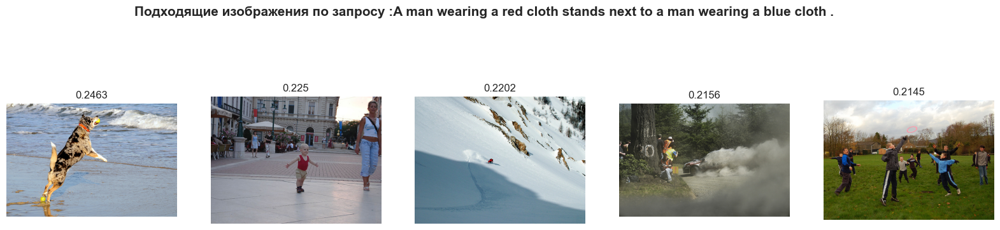

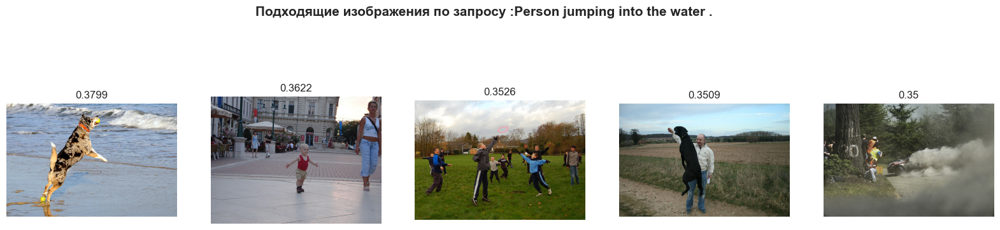

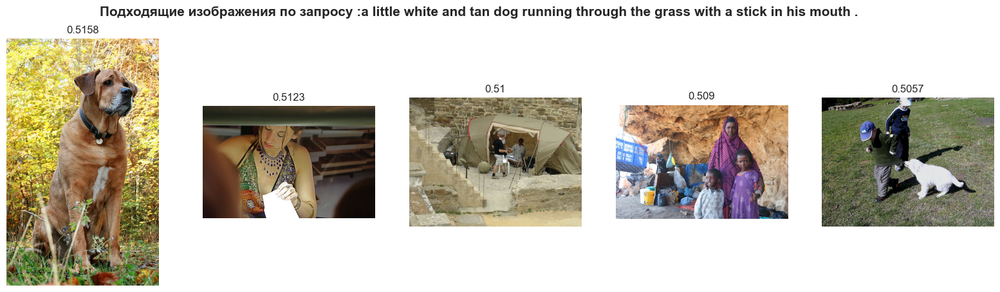

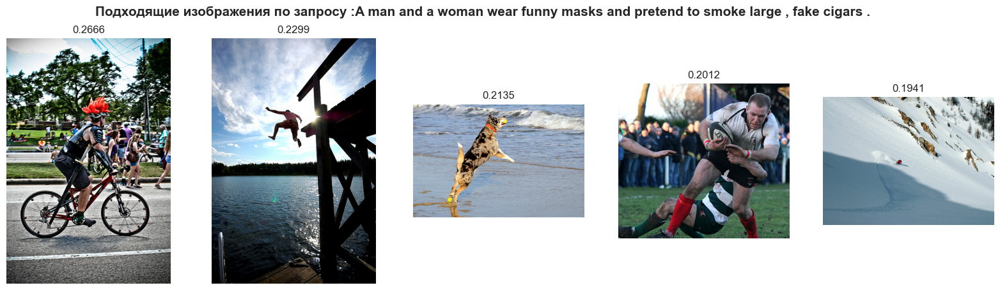

Kids in bathing suits with water splashing around them .!!! This image is unavailable in your country in compliance with local laws


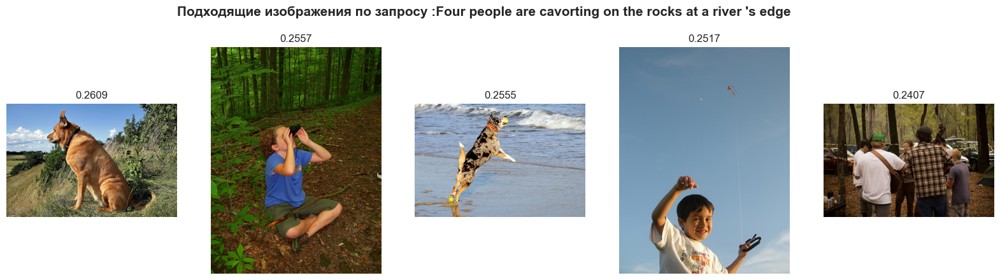

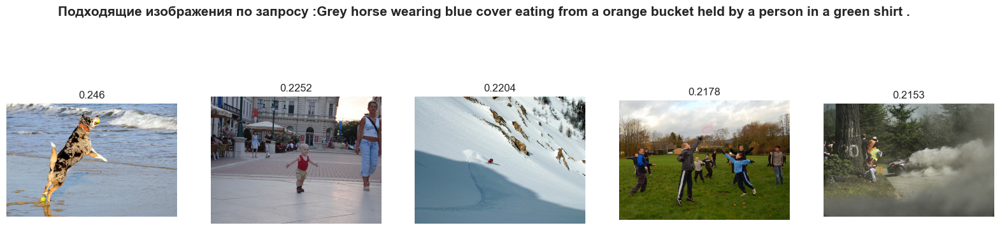

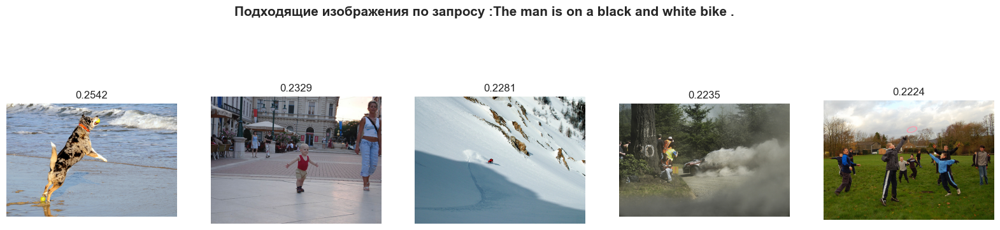

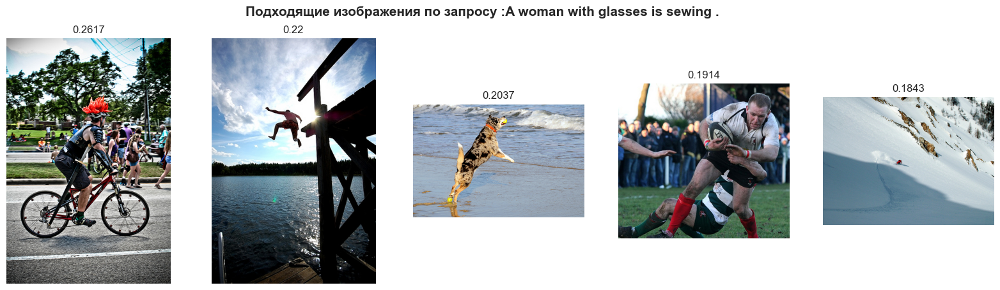

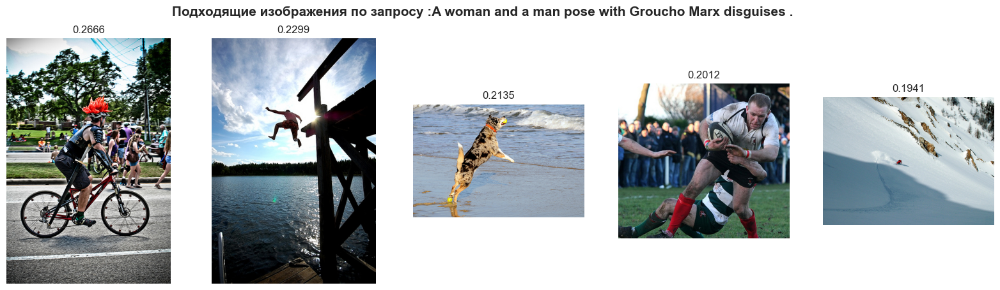

In [65]:
for i in df_test['query_text'].sample(10, random_state=666):
    picture_prediction(i)

**Вывод:**

В целом, качество отработки модели оставляет желать лучшего. Модель хорошо отрабатывает слово "play", удовлетворительно работает с 'dog', либо различными цветами.
Пути улучшения - работа с другими видами нейронных сетей, другие варианты обработки изображений и текстов.